In [ ]:
# Install required packages
!pip install lpips adabelief-pytorch ranger-adabelief --quiet

# Imports
import os
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.models as models

from skimage.metrics import structural_similarity as ssim
import lpips
from adabelief_pytorch import AdaBelief
from ranger_adabelief import RangerAdaBelief

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Path Setup
project_path = '/content/drive/MyDrive/NST_Project'
content_input_folder = os.path.join(project_path, 'resized_content_images')
style_input_folder = os.path.join(project_path, 'resized_style_images')
output_folder = os.path.join(project_path, 'stylized_outputs')
os.makedirs(output_folder, exist_ok=True)

# Device Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 4.0 MB/s eta 0:00:00
Mounted at /content/drive
Using device: cuda


In [ ]:
# ----- Image Loading and Preprocessing -----
def load_image(img_path):
    transform = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(img_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image.to(device)

def im_convert(tensor):
    image = tensor.to("cpu").clone().detach().squeeze(0)
    image = image.numpy().transpose(1, 2, 0)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return (image * 255).astype('uint8')

# ----- Feature Extraction and Gram Matrix -----
def gram_matrix(tensor):
    b, c, h, w = tensor.size()
    tensor = tensor.view(c, h * w)
    return torch.mm(tensor, tensor.t())

def get_features(image, model, layers):
    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[name] = x
    return features

# ----- Evaluation Preprocessing -----
def preprocess_eval_image(path):
    transform = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor()
    ])
    image = Image.open(path).convert('RGB')
    return transform(image).unsqueeze(0).to(device)

def to_numpy(tensor):
    return tensor.squeeze().permute(1, 2, 0).cpu().numpy()

# ----- Random Image Selection (same for all models) -----
content_file = random.choice(sorted(os.listdir(content_input_folder)))
style_file = random.choice(sorted(os.listdir(style_input_folder)))

content_path = os.path.join(content_input_folder, content_file)
style_path = os.path.join(style_input_folder, style_file)

content = load_image(content_path)
style = load_image(style_path)

# Preprocessed images for SSIM / LPIPS eval
eval_content = preprocess_eval_image(content_path)
eval_style = preprocess_eval_image(style_path)

# LPIPS setup
lpips_model = lpips.LPIPS(net='vgg').to(device)

print("Content Image:", content_file)
print("Style Image:", style_file)


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:08<00:00, 67.1MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/vgg.pth
Content Image: 1024px-Wild_horses_3.jpg
Style Image: Wassily_Kandinsky,__Studie_zu_Improvisation_3,__1909.jpeg


In [ ]:
def run_style_transfer(name, optimizer_fn, model, content_img, style_img,
                       content_path_eval, style_path_eval, lr=None):
    print(f"\nRunning {name}...")

    generated = content_img.clone().detach().requires_grad_(True).to(device)
    mse_loss = nn.MSELoss()

    # Extract layer names
    content_layer = '21'
    style_layers = ['0', '5', '10', '19', '28']

    # Get features
    content_features = get_features(content_img, model, [content_layer])
    style_features = get_features(style_img, model, style_layers)
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_layers}

    # Optimizer setup
    if lr:
        optimizer = optimizer_fn([generated], lr=lr)
    else:
        optimizer = optimizer_fn([generated])

    steps = 1000
    style_weight = 1e8
    content_weight = 1

    start = time.time()

    for step in range(1, steps + 1):
        gen_features = get_features(generated, model, style_layers + [content_layer])

        content_loss = mse_loss(gen_features[content_layer], content_features[content_layer])

        style_loss = 0
        for layer in style_layers:
            gen_gram = gram_matrix(gen_features[layer])
            style_gram = style_grams[layer]
            style_loss += mse_loss(gen_gram, style_gram)

        total_loss = content_weight * content_loss + style_weight * style_loss

        optimizer.zero_grad()
        total_loss.backward()
        torch.nn.utils.clip_grad_norm_([generated], max_norm=1.0)
        optimizer.step()

        if step % 100 == 0 or step == steps:
            print(f"[{name}] Step {step}/{steps}, Total Loss: {total_loss.item():.2f}")

    end = time.time()

    # Save stylized output image
    out_img = im_convert(generated)
    out_path = os.path.join(output_folder, f'stylized_{name.lower()}.jpg')
    Image.fromarray(out_img).save(out_path)

    # Evaluation metrics
    eval_output = preprocess_eval_image(out_path)
    ssim_score = ssim(to_numpy(eval_content), to_numpy(eval_output), channel_axis=2, data_range=1.0)
    gram_style_eval = gram_matrix(eval_style)
    gram_output_eval = gram_matrix(eval_output)
    gram_loss_value = F.mse_loss(gram_style_eval, gram_output_eval).item()
    lpips_score = lpips_model(eval_content, eval_output).item()

    return {
        "Model+Opt": name,
        "SSIM": round(ssim_score, 4),
        "Gram Loss": round(gram_loss_value, 4),
        "LPIPS": round(lpips_score, 4),
        "Training Time (s)": round(end - start, 2)
    }



Running VGG16_Adam...
[VGG16_Adam] Step 100/1000, Total Loss: 120891810280112128.00
[VGG16_Adam] Step 200/1000, Total Loss: 60854034407358464.00
[VGG16_Adam] Step 300/1000, Total Loss: 19027319301603328.00
[VGG16_Adam] Step 400/1000, Total Loss: 4138203137179648.00
[VGG16_Adam] Step 500/1000, Total Loss: 1565433840795648.00
[VGG16_Adam] Step 600/1000, Total Loss: 766387723173888.00
[VGG16_Adam] Step 700/1000, Total Loss: 534971664039936.00
[VGG16_Adam] Step 800/1000, Total Loss: 401659872149504.00
[VGG16_Adam] Step 900/1000, Total Loss: 328347196325888.00
[VGG16_Adam] Step 1000/1000, Total Loss: 265835272732672.00

Running VGG16_AdaBelief...
[VGG16_AdaBelief] Step 100/1000, Total Loss: 168819307386503168.00
[VGG16_AdaBelief] Step 200/1000, Total Loss: 121047038988124160.00
[VGG16_AdaBelief] Step 300/1000, Total Loss: 90347110972522496.00
[VGG16_AdaBelief] Step 400/1000, Total Loss: 65314456728502272.00
[VGG16_AdaBelief] Step 500/1000, Total Loss: 44331844975460352.00
[VGG16_AdaBelief]

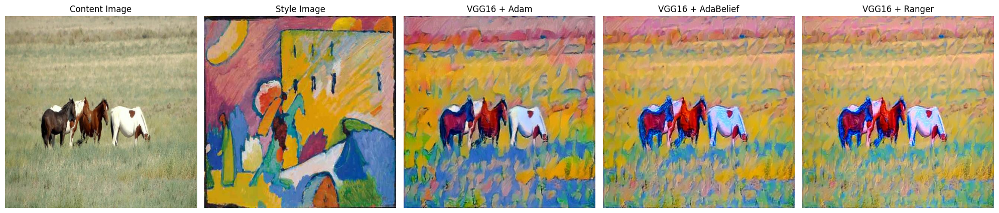

,Model+Opt,SSIM,Gram Loss,LPIPS,Training Time (s)
VGG16 + Adam,VGG16_Adam,0.5350,23651280.0,0.619,72.96
VGG16 + AdaBelief,VGG16_AdaBelief,0.6267,361745824.0,0.557,75.26
VGG16 + Ranger,VGG16_Ranger,0.6826,793222912.0,0.499,75.20


In [ ]:
# Load VGG16 model
vgg16 = models.vgg16(weights=models.VGG16_Weights.DEFAULT).features.to(device).eval()
for param in vgg16.parameters():
    param.requires_grad = False

# Run VGG16 + Adam
results_vgg16_adam = run_style_transfer(
    "VGG16_Adam",
    torch.optim.Adam,
    model=vgg16,
    content_img=content,
    style_img=style,
    content_path_eval=content_path,
    style_path_eval=style_path,
    lr=0.003
)

# Run VGG16 + AdaBelief
results_vgg16_adabelief = run_style_transfer(
    "VGG16_AdaBelief",
    lambda params: AdaBelief(
        params,
        lr=0.003,
        eps=1e-8,
        weight_decouple=False,
        rectify=False,
        print_change_log=False
    ),
    model=vgg16,
    content_img=content,
    style_img=style,
    content_path_eval=content_path,
    style_path_eval=style_path,
    lr=None
)

# Run VGG16 + Ranger
results_vgg16_ranger = run_style_transfer(
    "VGG16_Ranger",
    lambda params: RangerAdaBelief(
        params,
        lr=0.01,
        eps=1e-8
    ),
    model=vgg16,
    content_img=content,
    style_img=style,
    content_path_eval=content_path,
    style_path_eval=style_path,
    lr=None
)

# 📸 Display all 5 images in one row
content_disp = Image.open(content_path)
style_disp = Image.open(style_path)

output_adam = Image.open(os.path.join(output_folder, 'stylized_vgg16_adam.jpg'))
output_adabelief = Image.open(os.path.join(output_folder, 'stylized_vgg16_adabelief.jpg'))
output_ranger = Image.open(os.path.join(output_folder, 'stylized_vgg16_ranger.jpg'))

fig, axs = plt.subplots(1, 5, figsize=(20, 5))
titles = [
    "Content Image",
    "Style Image",
    "VGG16 + Adam",
    "VGG16 + AdaBelief",
    "VGG16 + Ranger"
]
images = [
    content_disp,
    style_disp,
    output_adam,
    output_adabelief,
    output_ranger
]

for i in range(5):
    axs[i].imshow(images[i])
    axs[i].set_title(titles[i])
    axs[i].axis("off")

plt.tight_layout()
plt.show()

# 📊 Show metrics for VGG16 runs
import pandas as pd

metrics_vgg16 = pd.DataFrame([
    results_vgg16_adam,
    results_vgg16_adabelief,
    results_vgg16_ranger
], index=[
    "VGG16 + Adam",
    "VGG16 + AdaBelief",
    "VGG16 + Ranger"
])

display(metrics_vgg16)


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:06<00:00, 95.0MB/s]



Running VGG19_Adam...
[VGG19_Adam] Step 100/1000, Total Loss: 102218915974742016.00
[VGG19_Adam] Step 200/1000, Total Loss: 53168379409727488.00
[VGG19_Adam] Step 300/1000, Total Loss: 21353368362418176.00
[VGG19_Adam] Step 400/1000, Total Loss: 4882301389373440.00
[VGG19_Adam] Step 500/1000, Total Loss: 1599823778152448.00
[VGG19_Adam] Step 600/1000, Total Loss: 781921814577152.00
[VGG19_Adam] Step 700/1000, Total Loss: 504830791516160.00
[VGG19_Adam] Step 800/1000, Total Loss: 390543322382336.00
[VGG19_Adam] Step 900/1000, Total Loss: 325486244790272.00
[VGG19_Adam] Step 1000/1000, Total Loss: 278973191815168.00

Running VGG19_AdaBelief...
[VGG19_AdaBelief] Step 100/1000, Total Loss: 140422564173316096.00
[VGG19_AdaBelief] Step 200/1000, Total Loss: 99932266796417024.00
[VGG19_AdaBelief] Step 300/1000, Total Loss: 73274968158240768.00
[VGG19_AdaBelief] Step 400/1000, Total Loss: 52098241063288832.00
[VGG19_AdaBelief] Step 500/1000, Total Loss: 34269404468346880.00
[VGG19_AdaBelief] 

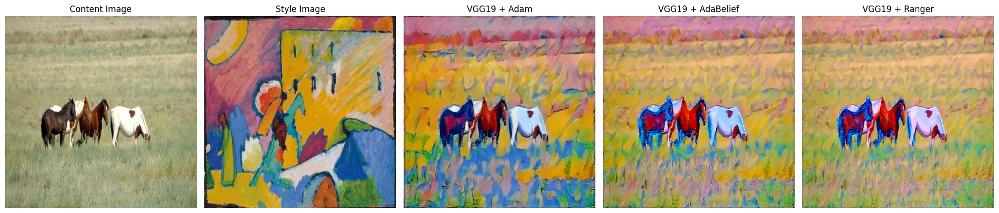

,Model+Opt,SSIM,Gram Loss,LPIPS,Training Time (s)
VGG19 + Adam,VGG19_Adam,0.5250,43923860.0,0.6258,87.45
VGG19 + AdaBelief,VGG19_AdaBelief,0.6385,440500064.0,0.5550,87.00
VGG19 + Ranger,VGG19_Ranger,0.7036,829637440.0,0.4966,87.23


In [ ]:
# Load VGG19 model
vgg19 = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features.to(device).eval()
for param in vgg19.parameters():
    param.requires_grad = False

# Run VGG19 + Adam
results_vgg19_adam = run_style_transfer(
    "VGG19_Adam",
    torch.optim.Adam,
    model=vgg19,
    content_img=content,
    style_img=style,
    content_path_eval=content_path,
    style_path_eval=style_path,
    lr=0.003
)

# Run VGG19 + AdaBelief
results_vgg19_adabelief = run_style_transfer(
    "VGG19_AdaBelief",
    lambda params: AdaBelief(
        params,
        lr=0.003,
        eps=1e-8,
        weight_decouple=False,
        rectify=False,
        print_change_log=False
    ),
    model=vgg19,
    content_img=content,
    style_img=style,
    content_path_eval=content_path,
    style_path_eval=style_path,
    lr=None
)

# Run VGG19 + Ranger
results_vgg19_ranger = run_style_transfer(
    "VGG19_Ranger",
    lambda params: RangerAdaBelief(
        params,
        lr=0.01,
        eps=1e-8
    ),
    model=vgg19,
    content_img=content,
    style_img=style,
    content_path_eval=content_path,
    style_path_eval=style_path,
    lr=None
)

# 📸 Display all 5 images in one row
output_adam = Image.open(os.path.join(output_folder, 'stylized_vgg19_adam.jpg'))
output_adabelief = Image.open(os.path.join(output_folder, 'stylized_vgg19_adabelief.jpg'))
output_ranger = Image.open(os.path.join(output_folder, 'stylized_vgg19_ranger.jpg'))

fig, axs = plt.subplots(1, 5, figsize=(20, 5))
titles = [
    "Content Image",
    "Style Image",
    "VGG19 + Adam",
    "VGG19 + AdaBelief",
    "VGG19 + Ranger"
]
images = [
    content_disp,
    style_disp,
    output_adam,
    output_adabelief,
    output_ranger
]

for i in range(5):
    axs[i].imshow(images[i])
    axs[i].set_title(titles[i])
    axs[i].axis("off")

plt.tight_layout()
plt.show()

# 📊 Show metrics for VGG19 runs
metrics_vgg19 = pd.DataFrame([
    results_vgg19_adam,
    results_vgg19_adabelief,
    results_vgg19_ranger
], index=[
    "VGG19 + Adam",
    "VGG19 + AdaBelief",
    "VGG19 + Ranger"
])

display(metrics_vgg19)


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 192MB/s]



Running ResNet50_Adam...
[ResNet50_Adam] Step 100/1000, Total Loss: 1903213945750028288.00
[ResNet50_Adam] Step 200/1000, Total Loss: 553318437720424448.00
[ResNet50_Adam] Step 300/1000, Total Loss: 42392194794913792.00
[ResNet50_Adam] Step 400/1000, Total Loss: 3161784466800640.00
[ResNet50_Adam] Step 500/1000, Total Loss: 1631987848708096.00
[ResNet50_Adam] Step 600/1000, Total Loss: 877908495171584.00
[ResNet50_Adam] Step 700/1000, Total Loss: 462505700753408.00
[ResNet50_Adam] Step 800/1000, Total Loss: 266786607988736.00
[ResNet50_Adam] Step 900/1000, Total Loss: 173133554253824.00
[ResNet50_Adam] Step 1000/1000, Total Loss: 123092865122304.00

Running ResNet50_AdaBelief...
[ResNet50_AdaBelief] Step 100/1000, Total Loss: 3102031539601408000.00
[ResNet50_AdaBelief] Step 200/1000, Total Loss: 2250325368592400384.00
[ResNet50_AdaBelief] Step 300/1000, Total Loss: 1529012343105650688.00
[ResNet50_AdaBelief] Step 400/1000, Total Loss: 957133736791506944.00
[ResNet50_AdaBelief] Step 50

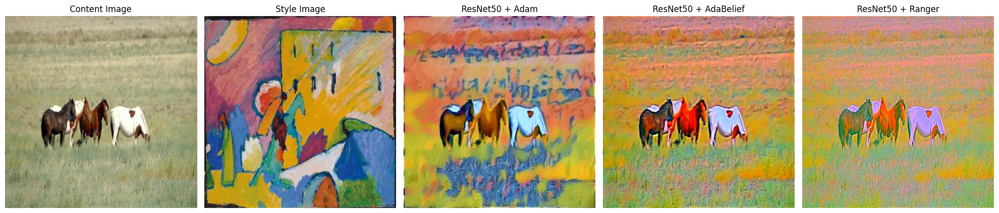

,Model+Opt,SSIM,Gram Loss,LPIPS,Training Time (s)
ResNet50 + Adam,ResNet50_Adam,0.5630,125229200.0,0.6401,42.91
ResNet50 + AdaBelief,ResNet50_AdaBelief,0.7315,319332224.0,0.4685,42.78
ResNet50 + Ranger,ResNet50_Ranger,0.8278,791082240.0,0.3812,42.80


In [ ]:
# ✅ Load ResNet50
resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT).to(device).eval()
for param in resnet50.parameters():
    param.requires_grad = False

# ✅ Define feature extractor for ResNet50
def get_resnet_features(image, model, layers):
    features = {}
    x = image
    conv_layers = [
        model.conv1, model.bn1, model.relu, model.maxpool,
        model.layer1, model.layer2, model.layer3, model.layer4
    ]
    names = ['conv1', 'bn1', 'relu', 'maxpool', 'layer1', 'layer2', 'layer3', 'layer4']
    for name, layer in zip(names, conv_layers):
        x = layer(x)
        if name in layers:
            features[name] = x
    return features

# ✅ Define style transfer function for ResNet50
def run_resnet_style_transfer(name, optimizer_fn, model, content_img, style_img, lr=None):
    print(f"\nRunning {name}...")

    generated = content_img.clone().detach().requires_grad_(True).to(device)
    mse_loss = nn.MSELoss()

    content_layer = 'layer3'
    style_layers = ['conv1', 'layer1', 'layer2', 'layer3', 'layer4']

    content_features = get_resnet_features(content_img, model, [content_layer])
    style_features = get_resnet_features(style_img, model, style_layers)
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_layers}

    if lr:
        optimizer = optimizer_fn([generated], lr=lr)
    else:
        optimizer = optimizer_fn([generated])

    steps = 1000
    style_weight = 1e8
    content_weight = 1

    start = time.time()
    for step in range(1, steps + 1):
        gen_features = get_resnet_features(generated, model, style_layers + [content_layer])
        content_loss = mse_loss(gen_features[content_layer], content_features[content_layer])
        style_loss = 0
        for layer in style_layers:
            gen_gram = gram_matrix(gen_features[layer])
            style_gram = style_grams[layer]
            style_loss += mse_loss(gen_gram, style_gram)
        total_loss = content_weight * content_loss + style_weight * style_loss
        optimizer.zero_grad()
        total_loss.backward()
        torch.nn.utils.clip_grad_norm_([generated], max_norm=1.0)
        optimizer.step()
        if step % 100 == 0 or step == steps:
            print(f"[{name}] Step {step}/{steps}, Total Loss: {total_loss.item():.2f}")
    end = time.time()

    out_img = im_convert(generated)
    out_path = os.path.join(output_folder, f'stylized_{name.lower()}.jpg')
    Image.fromarray(out_img).save(out_path)

    eval_output = preprocess_eval_image(out_path)
    ssim_score = ssim(to_numpy(eval_content), to_numpy(eval_output), channel_axis=2, data_range=1.0)
    gram_style_eval = gram_matrix(eval_style)
    gram_output_eval = gram_matrix(eval_output)
    gram_loss_value = F.mse_loss(gram_style_eval, gram_output_eval).item()
    lpips_score = lpips_model(eval_content, eval_output).item()

    return {
        "Model+Opt": name,
        "SSIM": round(ssim_score, 4),
        "Gram Loss": round(gram_loss_value, 4),
        "LPIPS": round(lpips_score, 4),
        "Training Time (s)": round(end - start, 2)
    }

# ✅ Run ResNet50 + Adam
resnet_adam = run_resnet_style_transfer(
    "ResNet50_Adam", torch.optim.Adam, resnet50, content, style, lr=0.003
)

# ✅ Run ResNet50 + AdaBelief
resnet_adabelief = run_resnet_style_transfer(
    "ResNet50_AdaBelief",
    lambda params: AdaBelief(params, lr=0.003, eps=1e-8, weight_decouple=False, rectify=False, print_change_log=False),
    resnet50, content, style
)

# ✅ Run ResNet50 + Ranger
resnet_ranger = run_resnet_style_transfer(
    "ResNet50_Ranger",
    lambda params: RangerAdaBelief(params, lr=0.01, eps=1e-8),
    resnet50, content, style
)

# ✅ Display all 5 images
output_adam = Image.open(os.path.join(output_folder, 'stylized_resnet50_adam.jpg'))
output_adabelief = Image.open(os.path.join(output_folder, 'stylized_resnet50_adabelief.jpg'))
output_ranger = Image.open(os.path.join(output_folder, 'stylized_resnet50_ranger.jpg'))

fig, axs = plt.subplots(1, 5, figsize=(20, 5))
titles = [
    "Content Image",
    "Style Image",
    "ResNet50 + Adam",
    "ResNet50 + AdaBelief",
    "ResNet50 + Ranger"
]
images = [
    content_disp,
    style_disp,
    output_adam,
    output_adabelief,
    output_ranger
]
for i in range(5):
    axs[i].imshow(images[i])
    axs[i].set_title(titles[i])
    axs[i].axis("off")
plt.tight_layout()
plt.show()

# ✅ Show metrics for ResNet50 runs
metrics_resnet = pd.DataFrame([
    resnet_adam,
    resnet_adabelief,
    resnet_ranger
], index=[
    "ResNet50 + Adam",
    "ResNet50 + AdaBelief",
    "ResNet50 + Ranger"
])
display(metrics_resnet)


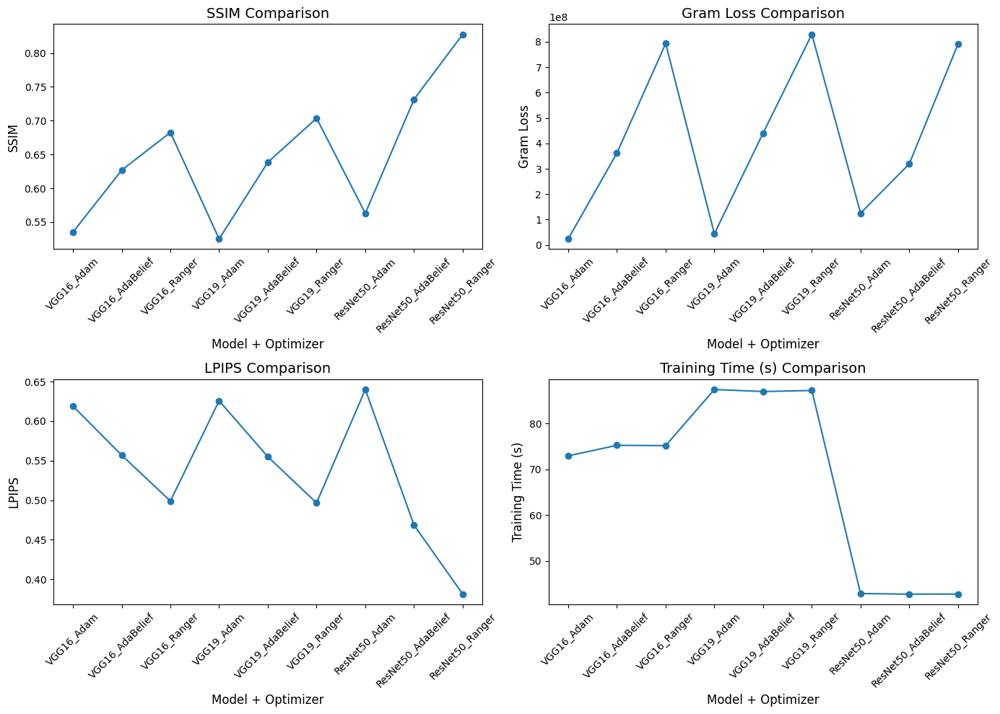

In [ ]:
import pandas as pd
# 📊 Combine all metric results
all_metrics_df = pd.DataFrame([
    results_vgg16_adam,
    results_vgg16_adabelief,
    results_vgg16_ranger,
    results_vgg19_adam,
    results_vgg19_adabelief,
    results_vgg19_ranger,
    resnet_adam,
    resnet_adabelief,
    resnet_ranger
])

# Set index to 'Model+Opt' column for readability
all_metrics_df.set_index("Model+Opt", inplace=True)

# 📈 Plot line charts for each metric
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
axs = axs.flatten()

metric_names = ["SSIM", "Gram Loss", "LPIPS", "Training Time (s)"]

for i, metric in enumerate(metric_names):
    axs[i].plot(all_metrics_df.index, all_metrics_df[metric], marker='o')
    axs[i].set_title(f'{metric} Comparison', fontsize=14)
    axs[i].set_xlabel('Model + Optimizer', fontsize=12)
    axs[i].set_ylabel(metric, fontsize=12)
    axs[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


Multi style blending

In [ ]:
import os
import random
import torch
from torchvision import transforms
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Google Drive folders
content_input_folder = "/content/drive/MyDrive/NST_Project/content_images"
style_input_folder = "/content/drive/MyDrive/NST_Project/style_images"

# Randomly select 1 content and 2 style images
content_file = random.choice(sorted(os.listdir(content_input_folder)))
style_files = random.sample(sorted(os.listdir(style_input_folder)), 2)

content_path = os.path.join(content_input_folder, content_file)
style_path1 = os.path.join(style_input_folder, style_files[0])
style_path2 = os.path.join(style_input_folder, style_files[1])

# Image preprocessing transform
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load and preprocess images
def load_image(path):
    image = Image.open(path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image.to(device)

content_img = load_image(content_path)
style_img1 = load_image(style_path1)
style_img2 = load_image(style_path2)

# Display selected filenames for reference
print("Selected Content Image:", content_file)
print("Selected Style Image 1:", style_files[0])
print("Selected Style Image 2:", style_files[1])


Selected Content Image: 1024px-Tower_Bridge_from_Shad_Thames.jpg
Selected Style Image 1: 512px-Raja_Ravi_Varma,_Expectation.jpg
Selected Style Image 2: 1024px-(Venice)_Allegory_of_the_Art_of_Painting_by_Francesco_Maggiotto_-_Gallerie_Accademia.jpg


In [ ]:
# --- Function for Multi-Style Transfer using ResNet50 + Ranger ---
def multi_style_transfer_resnet50(content_img, style_img1, style_img2, alpha=0.5, steps=1000):
    print("Running Multi-Style Transfer with ResNet50 + Ranger...")

    model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT).to(device).eval()
    for param in model.parameters():
        param.requires_grad = False

    def get_resnet_features(image, model, layers):
        features = {}
        x = image
        conv_layers = [
            model.conv1, model.bn1, model.relu, model.maxpool,
            model.layer1, model.layer2, model.layer3, model.layer4
        ]
        names = ['conv1', 'bn1', 'relu', 'maxpool', 'layer1', 'layer2', 'layer3', 'layer4']
        for name, layer in zip(names, conv_layers):
            x = layer(x)
            if name in layers:
                features[name] = x
        return features

    # Content and style settings
    content_layer = 'layer3'
    style_layers = ['conv1', 'layer1', 'layer2', 'layer3', 'layer4']
    content_weight = 1
    style_weight = 1e8
    mse_loss = nn.MSELoss()

    # Get features
    content_features = get_resnet_features(content_img, model, [content_layer])
    style1_features = get_resnet_features(style_img1, model, style_layers)
    style2_features = get_resnet_features(style_img2, model, style_layers)
    style1_grams = {l: gram_matrix(style1_features[l]) for l in style_layers}
    style2_grams = {l: gram_matrix(style2_features[l]) for l in style_layers}

    # Initialize image
    generated = content_img.clone().detach().requires_grad_(True).to(device)

    # Optimizer
    optimizer = RangerAdaBelief([generated], lr=0.01, eps=1e-8)

    # Optimization loop
    for step in range(1, steps + 1):
        gen_features = get_resnet_features(generated, model, style_layers + [content_layer])

        content_loss = mse_loss(gen_features[content_layer], content_features[content_layer])

        style1_loss = 0
        style2_loss = 0
        for l in style_layers:
            gen_gram = gram_matrix(gen_features[l])
            style1_loss += mse_loss(gen_gram, style1_grams[l])
            style2_loss += mse_loss(gen_gram, style2_grams[l])

        style_loss = alpha * style1_loss + (1 - alpha) * style2_loss
        total_loss = content_weight * content_loss + style_weight * style_loss

        optimizer.zero_grad()
        total_loss.backward()
        torch.nn.utils.clip_grad_norm_([generated], max_norm=1.0)
        optimizer.step()

        if step % 100 == 0 or step == steps:
            print(f"[Step {step}] Total Loss: {total_loss.item():.2f}")

    # Output image
    final_img = im_convert(generated)
    Image.fromarray(final_img).save(os.path.join(output_folder, "multi_style_output.jpg"))

    return final_img, round(style1_loss.item(), 2), round(style2_loss.item(), 2)


Running Multi-Style Transfer with ResNet50 + Ranger...
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
[Step 100] Total Loss: 7601340597722415104.00
[Step 200] Total Loss: 6378712804693639168.00
[Step 300] Total Loss: 4907427158508437504.00
[Step 400] Total Loss: 3520851186661982208.00
[Step 500] Total Loss: 2252968594545573888.00
[Step 600] Total Loss: 1156104315891351552.00
[Step 700] Total Loss: 473592746511171584.00
[Step 800] Total Loss: 180926991992619008.00
[Step 900] Total Loss: 85926429983768576.00
[Step 1000] Total Loss: 73929890541338624.00


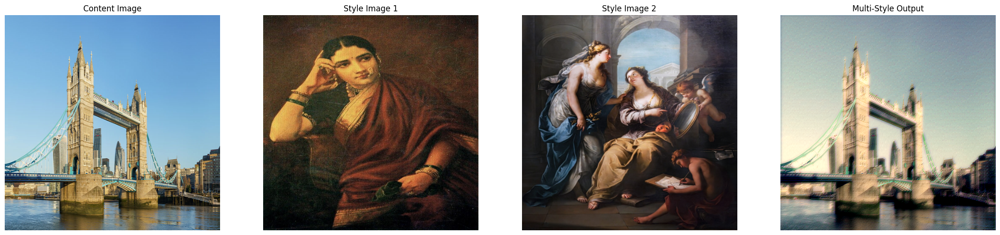

🎨 Style Contributions in Output:
Style 1 Loss Contribution: 772421056.0
Style 2 Loss Contribution: 706176768.0
🔍 Output leans more towards Style 2.


In [ ]:
# Run the multi-style transfer using preloaded images
output_img, style1_loss_val, style2_loss_val = multi_style_transfer_resnet50(
    content_img=content_img,
    style_img1=style_img1,
    style_img2=style_img2,
    alpha=0.5,
    steps=1000
)

# Display all images together
fig, axs = plt.subplots(1, 4, figsize=(22, 5))
axs[0].imshow(im_convert(content_img))
axs[0].set_title("Content Image")
axs[1].imshow(im_convert(style_img1))
axs[1].set_title("Style Image 1")
axs[2].imshow(im_convert(style_img2))
axs[2].set_title("Style Image 2")
axs[3].imshow(output_img)
axs[3].set_title("Multi-Style Output")
for ax in axs:
    ax.axis("off")
plt.tight_layout()
plt.show()

# Show style contributions
print("🎨 Style Contributions in Output:")
print(f"Style 1 Loss Contribution: {style1_loss_val}")
print(f"Style 2 Loss Contribution: {style2_loss_val}")

# Recommend dominant style
if style1_loss_val < style2_loss_val:
    print("🔍 Output leans more towards Style 1.")
elif style1_loss_val > style2_loss_val:
    print("🔍 Output leans more towards Style 2.")
else:
    print("⚖️ Output has an equal influence from both styles.")


In [ ]:
def multi_model_transfer(content_img, style_img, alpha=0.5, steps=1000):
    print("Running Multi-Model Blending with VGG19 + ResNet50 + Ranger...")

    # Load both models
    resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT).to(device).eval()
    vgg = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features.to(device).eval()
    for m in list(resnet.parameters()) + list(vgg.parameters()):
        m.requires_grad = False

    # Layers for feature extraction
    resnet_style_layers = ['conv1', 'layer1', 'layer2', 'layer3', 'layer4']
    vgg_style_layers = ['0', '5', '10', '19', '28']
    resnet_content_layer = 'layer3'

    # Helper: extract resnet features
    def get_resnet_features(image, model, layers):
        features = {}
        x = image
        convs = [model.conv1, model.bn1, model.relu, model.maxpool,
                 model.layer1, model.layer2, model.layer3, model.layer4]
        names = ['conv1', 'bn1', 'relu', 'maxpool', 'layer1', 'layer2', 'layer3', 'layer4']
        for name, layer in zip(names, convs):
            x = layer(x)
            if name in layers:
                features[name] = x
        return features

    # Extract content features from ResNet50
    content_features = get_resnet_features(content_img, resnet, [resnet_content_layer])

    # Extract style features
    resnet_style_features = get_resnet_features(style_img, resnet, resnet_style_layers)
    vgg_style_features = get_features(style_img, vgg, vgg_style_layers)

    # Compute Gram matrices
    resnet_grams = {l: gram_matrix(resnet_style_features[l]) for l in resnet_style_layers}
    vgg_grams = {l: gram_matrix(vgg_style_features[l]) for l in vgg_style_layers}

    # Init generated image
    generated = content_img.clone().detach().requires_grad_(True).to(device)
    optimizer = RangerAdaBelief([generated], lr=0.01, eps=1e-8)
    mse_loss = nn.MSELoss()
    style_weight = 1e8
    content_weight = 1

    style_loss_r, style_loss_v = 0, 0
    start = time.time()

    for step in range(1, steps + 1):
        gen_resnet_feats = get_resnet_features(generated, resnet, resnet_style_layers + [resnet_content_layer])
        gen_vgg_feats = get_features(generated, vgg, vgg_style_layers)

        # Content loss from ResNet
        content_loss = mse_loss(gen_resnet_feats[resnet_content_layer], content_features[resnet_content_layer])

        # ResNet style loss
        loss_r = 0
        for l in resnet_style_layers:
            loss_r += mse_loss(gram_matrix(gen_resnet_feats[l]), resnet_grams[l])

        # VGG style loss
        loss_v = 0
        for l in vgg_style_layers:
            loss_v += mse_loss(gram_matrix(gen_vgg_feats[l]), vgg_grams[l])

        # Weighted total style loss
        total_style_loss = alpha * loss_r + (1 - alpha) * loss_v
        total_loss = content_weight * content_loss + style_weight * total_style_loss

        optimizer.zero_grad()
        total_loss.backward()
        torch.nn.utils.clip_grad_norm_([generated], max_norm=1.0)
        optimizer.step()

        if step % 100 == 0 or step == steps:
            print(f"[Step {step}] Total Loss: {total_loss.item():.2f}")

    end = time.time()
    output_img = im_convert(generated)
    out_path = os.path.join(output_folder, "multi_model_output.jpg")
    Image.fromarray(output_img).save(out_path)

    return output_img, round(loss_r.item(), 2), round(loss_v.item(), 2), round(end - start, 2)


In [ ]:
output_img, loss_resnet, loss_vgg, total_time = multi_model_transfer(content_img, style_img1, alpha=0.5)

print(f"Style Loss Contribution from ResNet50: {loss_resnet}")
print(f"Style Loss Contribution from VGG19: {loss_vgg}")
print(f"Training Time: {total_time} seconds")

Running Multi-Model Blending with VGG19 + ResNet50 + Ranger...
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
[Step 100] Total Loss: 3972292519084949504.00
[Step 200] Total Loss: 3344360878706262016.00
[Step 300] Total Loss: 2596100335051210752.00
[Step 400] Total Loss: 1892827684036149248.00
[Step 500] Total Loss: 1247670407301955584.00
[Step 600] Total Loss: 681989610594631680.00
[Step 700] Total Loss: 315416007306903552.00
[Step 800] Total Loss: 138691443244924928.00
[Step 900] Total Loss: 64755668598390784.00
[Step 1000] Total Loss: 37890579442434048.00
Style Loss Contribution from ResNet50: 156835584.0
Style Loss Contribution from VGG19: 600976000.0
Training Time: 128.83 seconds


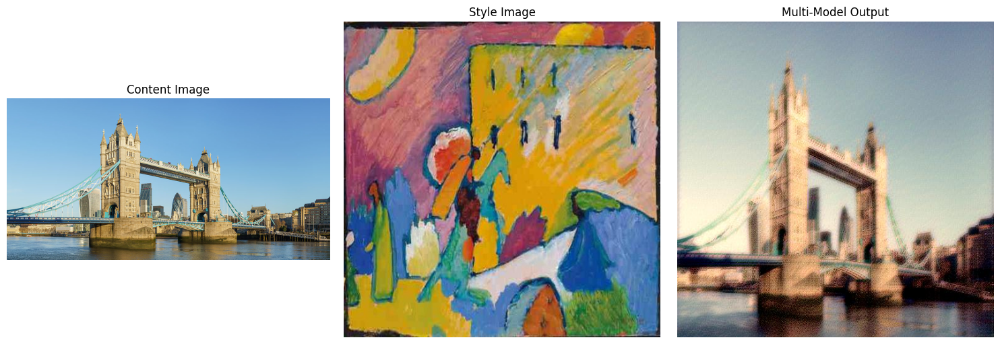

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Load saved images (adjust paths if needed)
content_image = Image.open(content_path)
style_image = Image.open(style_path)
output_image = Image.open(os.path.join(output_folder, "multi_model_output.jpg"))

# Plot the images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(content_image)
plt.title("Content Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(style_image)
plt.title("Style Image")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(output_image)
plt.title("Multi-Model Output")
plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# =========================
# Video NST — ResNet50 + Ranger (OpenCV split, MoviePy join) + LPIPS stability
# =========================
!pip install moviepy opencv-python-headless --quiet

import os, time, shutil, math
import cv2
import numpy as np
from moviepy.editor import ImageSequenceClip
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as T
from PIL import Image

# ---- Paths (edit if your folder names differ) ----
video_in  = "/content/drive/MyDrive/NST_Project/Video/NST_sample.mp4"
video_out = "/content/drive/MyDrive/NST_Project/Video/NST_sample_stylized_resnet50_ranger.mp4"
style_dir = "/content/drive/MyDrive/NST_Project/resized_style_images"   # pick one style
style_img = os.path.join(style_dir, sorted(os.listdir(style_dir))[0])

# ---- Ensure output folder exists ----
os.makedirs(os.path.dirname(video_out), exist_ok=True)

# ---- Use existing globals if present ----
try:
    _ = device
except NameError:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# LPIPS model (use existing if present)
try:
    lpips_model.eval()
except:
    import lpips
    lpips_model = lpips.LPIPS(net='vgg').to(device).eval()

# ---- Small helpers (safe if you already defined these above) ----
def _frame_transform_512(pil_img):
    return T.Compose([
        T.Resize((512, 512)),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225])
    ])(pil_img).unsqueeze(0)

def _tensor01_from_uint8(rgb_uint8):
    # [H,W,3] uint8 RGB -> [1,3,H,W] float in [0,1]
    t = torch.from_numpy(rgb_uint8).float() / 255.0
    t = t.permute(2,0,1).unsqueeze(0).contiguous()
    return t

def _to_lpips_range(x01):
    return x01*2.0 - 1.0

# If gram_matrix not defined:
try:
    gram_matrix
except NameError:
    def gram_matrix(tensor):
        b, c, h, w = tensor.size()
        Fm = tensor.view(b, c, h*w)
        G = torch.bmm(Fm, Fm.transpose(1,2))
        return G

# If get_resnet_features not defined:
try:
    get_resnet_features
except NameError:
    def get_resnet_features(image, model, layers):
        feats = {}
        x = image
        conv_layers = [model.conv1, model.bn1, model.relu, model.maxpool,
                       model.layer1, model.layer2, model.layer3, model.layer4]
        names = ['conv1','bn1','relu','maxpool','layer1','layer2','layer3','layer4']
        for name, layer in zip(names, conv_layers):
            x = layer(x)
            if name in layers:
                feats[name] = x
        return feats

# If im_convert not defined:
try:
    im_convert
except NameError:
    def im_convert(tensor):
        image = tensor.detach().clone().squeeze(0).to("cpu")
        image = image.numpy().transpose(1,2,0)
        mean = np.array([0.485, 0.456, 0.406])
        std  = np.array([0.229, 0.224, 0.225])
        image = std*image + mean
        image = np.clip(image, 0, 1)
        return (image*255).astype('uint8')

# If load_image not defined:
try:
    load_image
except NameError:
    def load_image(img_path):
        pil = Image.open(img_path).convert('RGB')
        return _frame_transform_512(pil).to(device)

# ---- Core: stylize a single frame with ResNet50 + Ranger ----
from ranger_adabelief import RangerAdaBelief

def stylize_frame_resnet50_ranger(
    frame_rgb_uint8: np.ndarray,
    resnet_model,
    style_grams: dict,
    content_layer='layer3',
    style_layers=('conv1','layer1','layer2','layer3','layer4'),
    steps=200, lr=0.01, style_weight=1e8, content_weight=1.0,
    init_from_prev: torch.Tensor=None
):
    """
    frame_rgb_uint8: [H,W,3] RGB uint8
    init_from_prev:  if provided, a normalized tensor [1,3,512,512] (ImageNet norm) to warm-start
    """
    mse = nn.MSELoss()

    # Prepare content tensor (ImageNet norm, 512)
    pil = Image.fromarray(frame_rgb_uint8)
    content_img = _frame_transform_512(pil).to(device)

    # Generated init
    if init_from_prev is not None:
        generated = init_from_prev.clone().detach().requires_grad_(True)
    else:
        generated = content_img.clone().detach().requires_grad_(True)

    # Precompute content feat
    content_feats = get_resnet_features(content_img, resnet_model, [content_layer])

    # Optimizer
    opt = RangerAdaBelief([generated], lr=lr, eps=1e-8)

    # Optimize
    for step in range(1, steps+1):
        gen_feats = get_resnet_features(generated, resnet_model, list(style_layers)+[content_layer])

        c_loss = mse(gen_feats[content_layer], content_feats[content_layer])
        s_loss = 0.0
        for l in style_layers:
            gG = gram_matrix(gen_feats[l])
            sG = style_grams[l]
            s_loss += mse(gG, sG)

        total = content_weight*c_loss + style_weight*s_loss
        opt.zero_grad()
        total.backward()
        torch.nn.utils.clip_grad_norm_([generated], 1.0)
        opt.step()

    # Return both uint8 RGB and next init tensor
    out_rgb = im_convert(generated)
    return out_rgb, generated.detach()

# ---- Build ResNet50 model & style grams once ----
resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT).to(device).eval()
for p in resnet50.parameters(): p.requires_grad = False
style_layers = ('conv1','layer1','layer2','layer3','layer4')
content_layer = 'layer3'

style_img_t = load_image(style_img)                          # [1,3,512,512] ImageNet norm
style_feats  = get_resnet_features(style_img_t, resnet50, style_layers)
style_grams  = {l: gram_matrix(style_feats[l]) for l in style_layers}

# ---- Read video, stylize frames, collect LPIPS variation ----
tmp_frames_dir = "/content/video_nst_tmp"
if os.path.exists(tmp_frames_dir): shutil.rmtree(tmp_frames_dir)
os.makedirs(tmp_frames_dir, exist_ok=True)

cap = cv2.VideoCapture(video_in)
if not cap.isOpened():
    raise RuntimeError(f"Cannot open input video: {video_in}")

fps = cap.get(cv2.CAP_PROP_FPS)
fps = fps if fps and not math.isnan(fps) and fps > 0 else 24.0

frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f"Video FPS: {fps}, Frames: {frame_count}")

prev_init = None
prev_lpips_ref = None
lpips_diffs = []   # LPIPS(frame_t, frame_{t-1}) across output frames

start_time = time.time()
idx = 0
while True:
    ok, bgr = cap.read()
    if not ok: break
    idx += 1
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    out_rgb, prev_init = stylize_frame_resnet50_ranger(
        rgb, resnet50, style_grams,
        content_layer=content_layer, style_layers=style_layers,
        steps=200, lr=0.01, style_weight=1e8, content_weight=1.0,
        init_from_prev=prev_init   # warm-start to reduce flicker
    )

    # Save stylized frame
    out_path = os.path.join(tmp_frames_dir, f"frame_{idx:06d}.png")
    Image.fromarray(out_rgb).save(out_path)

    # LPIPS vs previous stylized frame (perceptual stability)
    out01 = _tensor01_from_uint8(out_rgb).to(device)   # [1,3,H,W] in [0,1]
    if prev_lpips_ref is not None:
        diff = lpips_model(_to_lpips_range(out01), _to_lpips_range(prev_lpips_ref)).item()
        lpips_diffs.append(diff)
    prev_lpips_ref = out01.detach()

cap.release()
elapsed = round(time.time() - start_time, 2)
print(f"Stylized {idx} frames in {elapsed}s")

# ---- Recombine with MoviePy ----
frame_files = sorted([os.path.join(tmp_frames_dir, f) for f in os.listdir(tmp_frames_dir) if f.endswith(".png")])
clip = ImageSequenceClip(frame_files, fps=fps)
clip.write_videofile(video_out, codec="libx264", audio=False, verbose=False, logger=None)
print("Saved:", video_out)

# ---- LPIPS stability report ----
if len(lpips_diffs) > 0:
    lpips_std = float(np.std(lpips_diffs))
    lpips_mean = float(np.mean(lpips_diffs))
    print({"LPIPS mean (frame-to-frame)": round(lpips_mean, 4),
           "LPIPS std (frame-to-frame)":  round(lpips_std, 4),
           "Frames evaluated": len(lpips_diffs)})
else:
    print("Not enough frames for LPIPS variation (need >=2 stylized frames).")


/usr/local/lib/python3.12/dist-packages/moviepy/config_defaults.py:47: SyntaxWarning: invalid escape sequence '\P'
  IMAGEMAGICK_BINARY = r"C:\Program Files\ImageMagick-6.8.8-Q16\magick.exe"
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: SyntaxWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:367: SyntaxWarning: invalid escape sequence '\d'
  rotation_lines = [l for l in lines if 'rotate          :' in l and re.search('\d+$', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:370: SyntaxWarning: invalid escape sequence '\d'
  match = re.search('\d+$', rotation_line)
  if event.key is 'enter':



Video FPS: 24.0, Frames: 224
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers
Ranger optimizer loaded. 
Gradient Centralization usage = True

In [ ]:
# =========================
# Playable side-by-side (Original | Stylized) in Colab
# Uses MoviePy compositing + H.264 (libx264) + yuv420p
# =========================
!pip install moviepy --quiet

import os, math
from moviepy.editor import VideoFileClip, clips_array
from IPython.display import Video, display

orig_path = "/content/drive/MyDrive/NST_Project/Video/NST_sample.mp4"
styl_path = "/content/drive/MyDrive/NST_Project/Video/NST_sample_stylized_resnet50_ranger.mp4"
out_path  = "/content/drive/MyDrive/NST_Project/Video/NST_sample_side_by_side.mp4"
os.makedirs(os.path.dirname(out_path), exist_ok=True)

# Load clips, match heights, trim to shortest duration
left  = VideoFileClip(orig_path).without_audio().resize(height=512)
right = VideoFileClip(styl_path).without_audio().resize(height=512)
min_dur = min(left.duration, right.duration)
left  = left.subclip(0, min_dur)
right = right.subclip(0, min_dur)

# Side-by-side grid: Original | Stylized
side = clips_array([[left, right]])

# Write H.264 + yuv420p for HTML5 player compatibility
side.write_videofile(
    out_path,
    codec="libx264",
    audio=False,
    preset="medium",
    ffmpeg_params=["-pix_fmt", "yuv420p"],
    verbose=False,
    logger=None
)

# Show in the notebook
display(Video(out_path, embed=True))
